In [1]:
import os

import tqdm
import torch
import numpy as np
import matplotlib as mpl
import matplotlib.pyplot as plt
import seaborn

import vari
import vari.datasets
import vari.models
import vari.inference
from vari.layers import GaussianSample, BernoulliSample

from sklearn.datasets import make_circles

In [2]:
experiments_dir = '/nas/experiments/sacred/models/'
data_root = '/home/jdh/repos/vari/torch_data'
mpl.style.use('default')

## Select models and data

In [39]:
train_dataset = 'MNIST'
vae_id = 6223
hvae_id = 6236

run_ids = dict(
    vae=dict(
        run_id=6223,
        exclude_labels=[4],
    ),
    hvae=dict(
        run_id=6232,
        exclude_labels=[4],
    )
)

#run_ids = dict(
#    vae=6209,
#    hvae=6203,
##    avae=6219,
#)

#dataset_name = 'spirals'
#run_ids = dict(
#    vae=6211,
#    avae=6220,
#    hvae=6205,
#)

## Get datasets

In [80]:
mnist_train = vari.datasets.MNISTBinarized(split='train', preprocess='static', exclude_labels=[], root=data_root)
mnist_test1 = vari.datasets.MNISTBinarized(split='test', preprocess='static', exclude_labels=[], root=data_root)

In [72]:
fashion_mnist_train = vari.datasets.FashionMNISTBinarized(split='train', preprocess='static', exclude_labels=[], root=data_root)
fashion_mnist_test1 = vari.datasets.FashionMNISTBinarized(split='test', preprocess='static', exclude_labels=[], root=data_root)

### Visualize dataset

In [19]:
def plot_image_matrix(images, ax):
    rows = int(np.sqrt(len(images)))
    cols = rows
    image_rows = [np.concatenate(images[i:i+cols], axis=1) for i in range(rows)]
    image_matrix = np.concatenate(image_rows, axis=0)
    ax.imshow(image_matrix, cmap='binary_r')
    ax.axis('off')

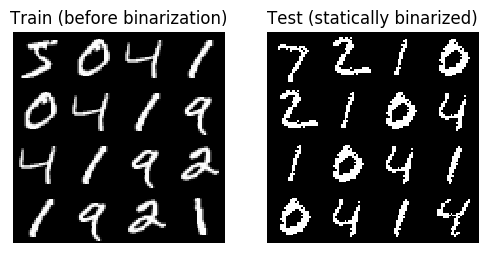

In [23]:
start_idx = 0
n_images = 4 * 4
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(6, 12))
plot_image_matrix(mnist_train.examples[start_idx: start_idx + n_images], ax1)
plot_image_matrix(mnist_test1.examples[start_idx: start_idx + n_images], ax2)
ax1.set_title('Train (before binarization)')
ax2.set_title('Test (statically binarized)');

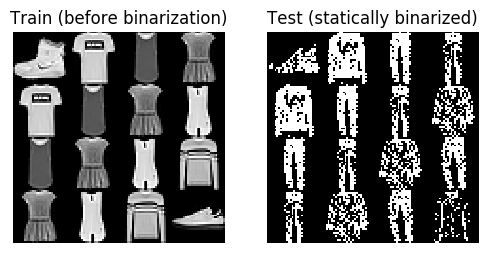

In [24]:
start_idx = 0
n_images = 4 * 4
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(6, 12))
plot_image_matrix(fashion_mnist_train.examples[start_idx: start_idx + n_images], ax1)
plot_image_matrix(fashion_mnist_test1.examples[start_idx: start_idx + n_images], ax2)
ax1.set_title('Train (before binarization)')
ax2.set_title('Test (statically binarized)');

## Load models

### VAE

In [35]:
vae_kwargs = vari.models.get_default_model_config('VariationalAutoencoder', 'MNIST')
vae = vari.models.VariationalAutoencoder(x_dim=784, **vae_kwargs)
vae.load_state_dict(torch.load(
    os.path.join(experiments_dir, str(vae_id), 'model_state_dict.pkl'),
    map_location=torch.device('cpu')
))

<All keys matched successfully>

### AVAE

In [36]:
vae_kwargs = vari.models.get_default_model_config('AuxilliaryVariationalAutoencoder', 'MNIST')
avae = vari.models.AuxilliaryVariationalAutoencoder(x_dim=784, **vae_kwargs)
avae.load_state_dict(torch.load(
    os.path.join(experiments_dir, str(run_ids['avae']), 'model_state_dict.pkl'),
    map_location=torch.device('cpu')
))

KeyError: 'avae'

### HVAE

In [101]:
vae_kwargs = vari.models.get_default_model_config('HierarchicalVariationalAutoencoder', 'MNIST')
hvae = vari.models.HierarchicalVariationalAutoencoder(x_dim=784, **vae_kwargs)
hvae.load_state_dict(torch.load(
    os.path.join(experiments_dir, str(hvae_id), 'model_state_dict.pkl'),
    map_location=torch.device('cpu')
))

<All keys matched successfully>

In [16]:
models = dict(
    vae=vae,
    avae=avae,
    hvae=hvae
)

## Visualize latent space

In [81]:
train_data = 'MNIST'
if train_data == 'MNIST':
    x_train = mnist_train.examples.reshape(-1, 784)
    x_test1 = mnist_test1.examples.reshape(-1, 784)
    x_test2 = fashion_mnist_test1.examples.reshape(-1, 784)
    y_train = mnist_train.labels.argmax(axis=1)
    y_test1 = mnist_test1.labels.argmax(axis=1)
    y_test2 = fashion_mnist_test1.labels.argmax(axis=1)

In [82]:
def plot_vectors(vectors, fig=None, ax=None, figsize=(20, 20), color='C0', alpha=0.4, label='train', label_ids=None):
    if ax is None:
        fig = plt.figure(figsize=figsize)
        ax = fig.add_subplot(1, 1, 1)
        
    if label_ids is not None:
        for i in np.unique(label_ids):
            ax.scatter(vectors[label_ids==i, 0], vectors[label_ids==i, 1], c=f'C{i}', alpha=alpha, label=f"{label}:class{i}")
    else:
        ax.scatter(vectors[:,0], vectors[:,1], c=color, alpha=alpha, label=label)
    #ax1.scatter(vae_qz_mu_x2[:,0], vae_qz_mu_x2[:,1], c=[test1_0], alpha=0.4, label="test1")
    #ax.plot(mesh[:,0], mesh[:,1], c='black', alpha=.2, linewidth=.5)
    #ax.scatter(mesh[:,0], mesh[:,1], c=[(.8, .8, .8, .8)], alpha=.5, s=5.)
    # ax1.axis('off')
    ax.legend()
    return fig, ax

### VAE

In [83]:
with torch.no_grad():
    vae_qz_x_train, (vae_qz_mu_x_train, vae_qz_log_var_x_train) = vae.encode(torch.FloatTensor(x_train))
    vae_qz_x_test1, (vae_qz_mu_x_test1, vae_qz_log_var_x_test1) = vae.encode(torch.FloatTensor(x_test1))
    vae_qz_x_test2, (vae_qz_mu_x_test2, vae_qz_log_var_x_test2) = vae.encode(torch.FloatTensor(x_test2))

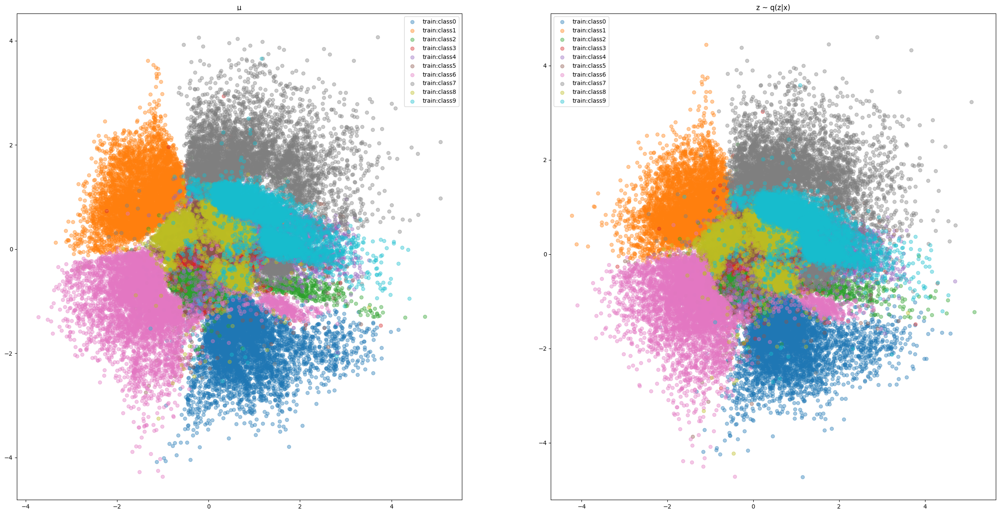

In [84]:
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 6))
plot_vectors(vae_qz_mu_x_train, label_ids=y_train, ax=ax1)
plot_vectors(vae_qz_x_train, label_ids=y_train, ax=ax2)
ax1.set_title('µ')
ax2.set_title('z ~ q(z|x)')
plt.show()

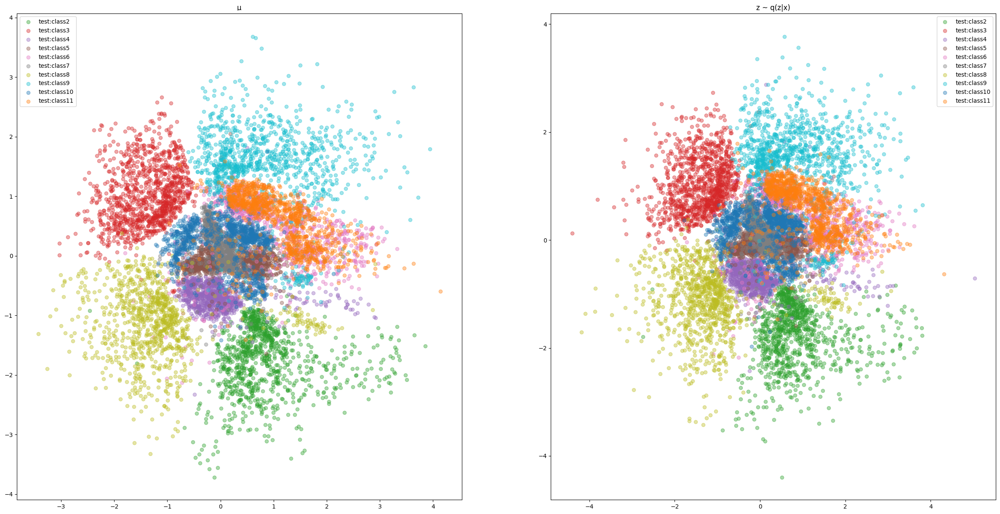

In [79]:
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 6))
plot_vectors(vae_qz_mu_x_test1, label_ids=y_test1+2, ax=ax1, label='test')
plot_vectors(vae_qz_x_test1, label_ids=y_test1+2, ax=ax2, label='test')
ax1.set_title('µ')
ax2.set_title('z ~ q(z|x)')
plt.show()

In [88]:
vae_qz_mu_x_train.numpy()

array([[-0.0241084 ,  0.03479903],
       [ 0.6436453 , -1.346466  ],
       [ 0.5695709 , -0.12511691],
       ...,
       [-0.00696342,  0.11539577],
       [-2.5765324 , -1.2545412 ],
       [ 0.01466949,  0.7616113 ]], dtype=float32)

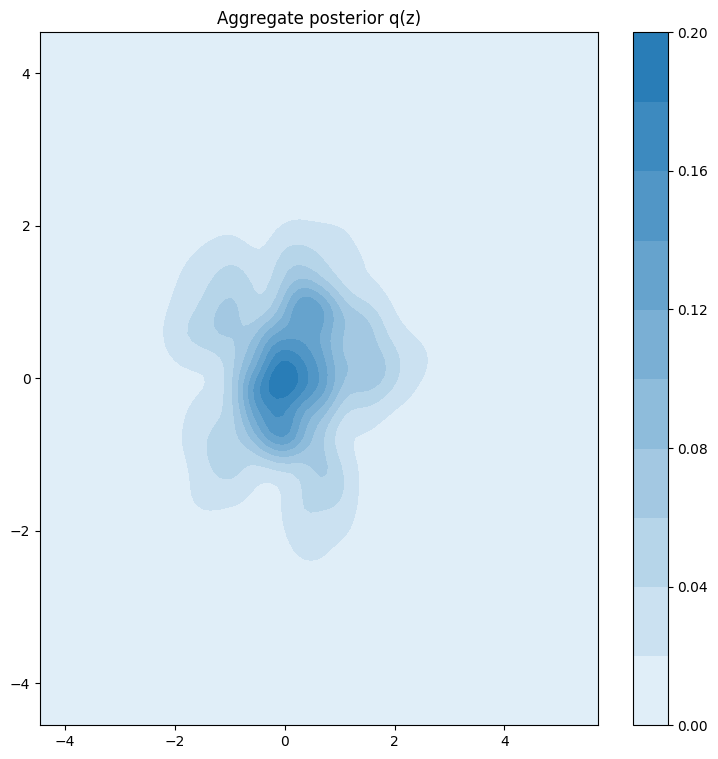

In [113]:
fig, ax1 = plt.subplots(1, 1, figsize=(9, 9))
ax1.set_title('Aggregate posterior q(z)')
seaborn.kdeplot(vae_qz_x_test1[:, 0].numpy(),
                data2=vae_qz_x_test1[:, 1].numpy(),
                shade=True,
                cbar=True,
                ax=ax1)

### AVAE

In [22]:
with torch.no_grad():
    (avae_qz_x_train, (avae_qz_mu_x_train, avae_qz_log_var_x_train)), (avae_qa_x_train, (avae_qa_mu_x_train, avae_qa_log_var_x_train)) = avae.encode(torch.FloatTensor(x_train))
    (avae_qz_x_test1, (avae_qz_mu_x_test1, avae_qz_log_var_x_test1)), (avae_qa_x_test1, (avae_qa_mu_x_test1, avae_qa_log_var_x_test1)) = avae.encode(torch.FloatTensor(x_test1))
    (avae_qz_mesh, (avae_qz_mu_mesh, avae_qz_log_var_mesh)), (avae_qa_mesh, (avae_qa_mu_mesh, avae_qa_log_var_mesh)) = avae.encode(torch.FloatTensor(x_train_meshgrid))

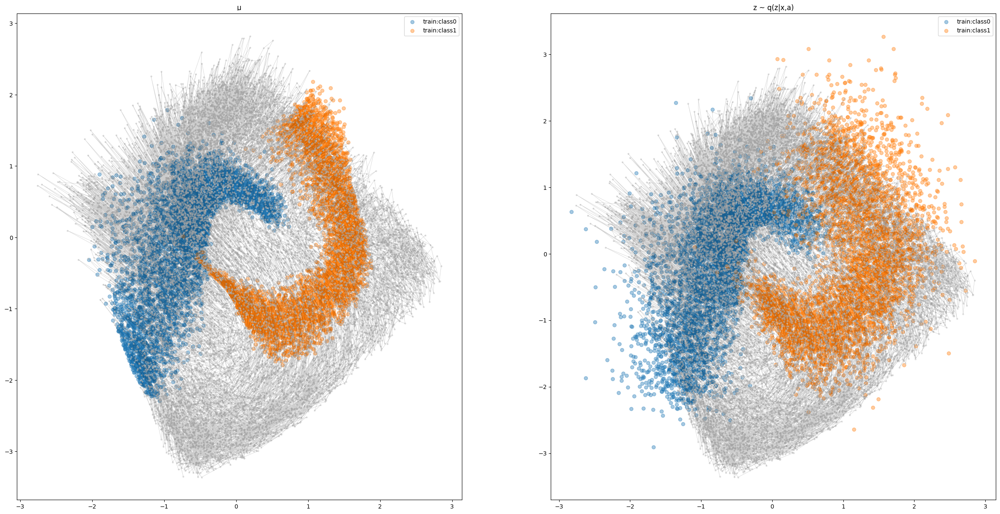

In [23]:
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 6))
plot_vectors_and_mesh(avae_qz_mu_x_train, avae_qz_mu_mesh, label_ids=y_train, ax=ax1)
plot_vectors_and_mesh(avae_qz_x_train, avae_qz_mu_mesh, label_ids=y_train, ax=ax2)
ax1.set_title('µ')
ax2.set_title('z ~ q(z|x,a)')
plt.show()

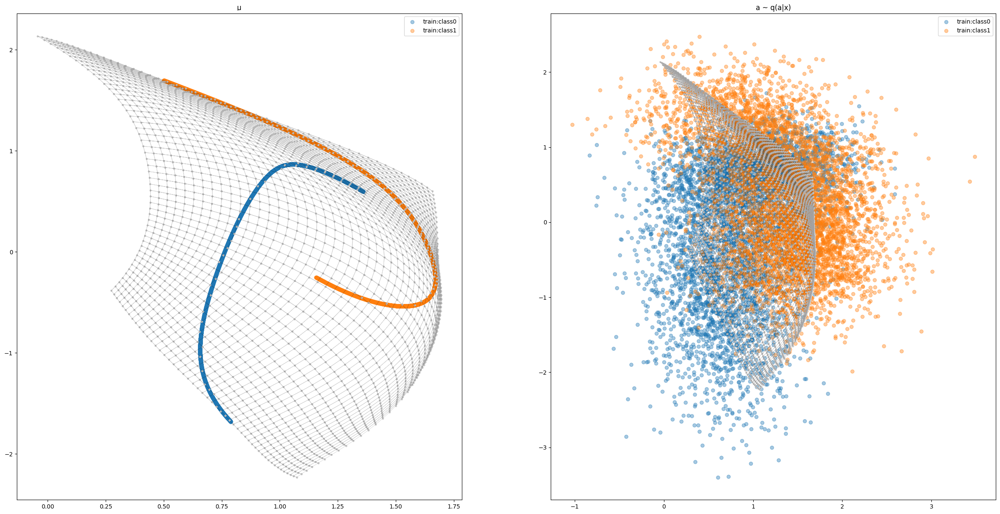

In [24]:
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 6))
plot_vectors_and_mesh(avae_qa_mu_x_train, avae_qa_mu_mesh, label_ids=y_train, ax=ax1)
plot_vectors_and_mesh(avae_qa_x_train, avae_qa_mu_mesh, label_ids=y_train, ax=ax2)
ax1.set_title('µ')
ax2.set_title('a ~ q(a|x)')
plt.show()

### HVAE

In [102]:
with torch.no_grad():
    latents_train = hvae.encode(torch.FloatTensor(x_train))
    latents_test1 = hvae.encode(torch.FloatTensor(x_test1))
    latents_test2 = hvae.encode(torch.FloatTensor(x_test2))

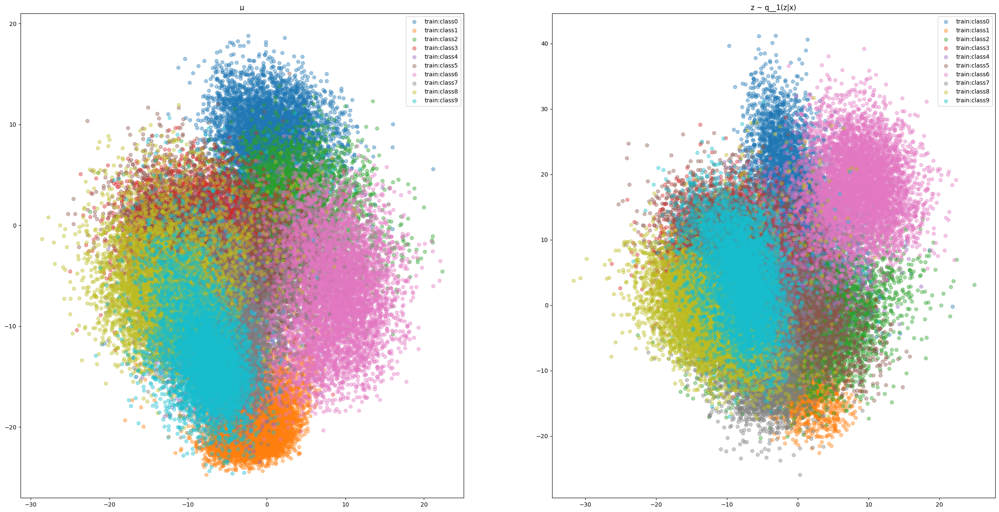

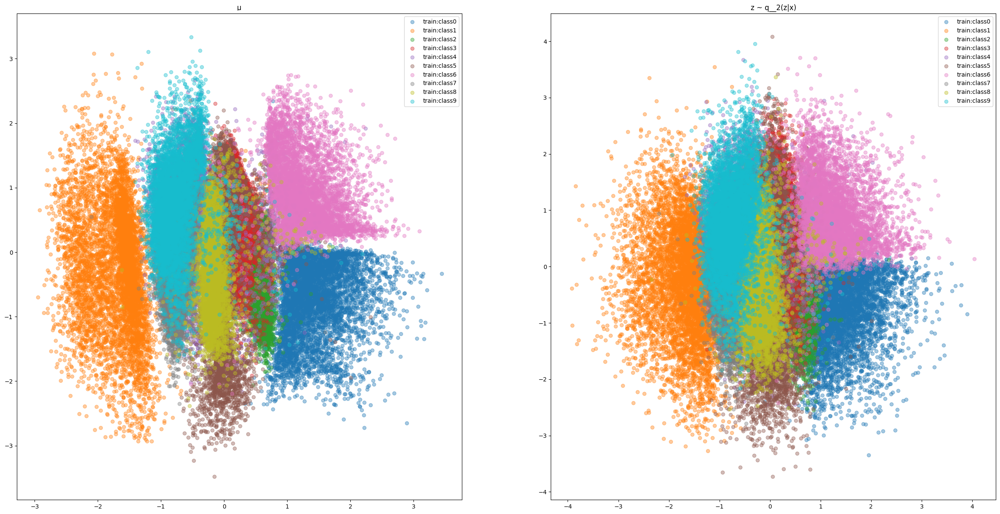

In [116]:
non_2d_elements = [0, 3]
for i_layer in range(len(latents_train)):
    hvae_qz_x_train = latents_train[i_layer][0]
    hvae_qz_mu_x_train = latents_train[i_layer][1][0]
    
    if hvae_qz_x_train.shape[1] > 2:
        hvae_qz_x_train = hvae_qz_x_train[:, non_2d_elements]
    
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 6))
    plot_vectors(hvae_qz_mu_x_train, label_ids=y_train, ax=ax1)
    plot_vectors(hvae_qz_x_train, label_ids=y_train, ax=ax2)
    ax1.set_title('µ')
    ax2.set_title(f'z ~ q__{i_layer+1}(z|x)')
    plt.show()

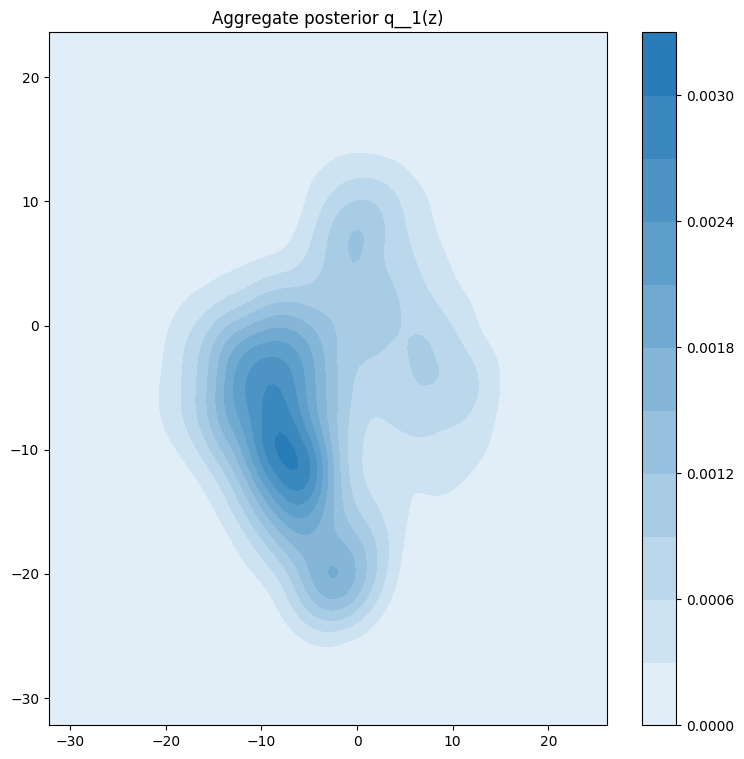

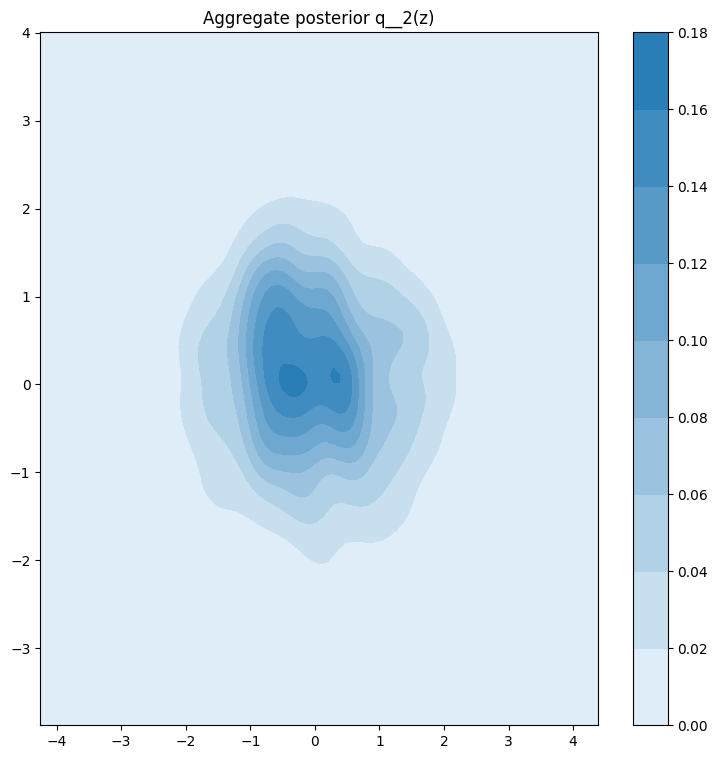

In [112]:
for i_layer in range(len(latents_test1)):
    hvae_qz_x_test1 = latents_test1[i_layer][0]
    hvae_qz_mu_x_test1 = latents_test1[i_layer][1][0]
    
    fig, ax1 = plt.subplots(1, 1, figsize=(9, 9))
    ax1.set_title(f'Aggregate posterior q__{i_layer+1}(z)')
    seaborn.kdeplot(hvae_qz_x_test1[:, 0].numpy(),
                    data2=hvae_qz_x_test1[:, 1].numpy(),
                    shade=True,
                    cbar=True,
                    ax=ax1)

## Visualize reconstruction

In [30]:
n_samples = 1000
x_originals = torch.FloatTensor(x_train[:n_samples, :])
with torch.no_grad():
    vae_p_x_reconstructions, (vae_p_x_mu, vae_p_x_log_var) = vae(x_originals)
    hvae_p_x_reconstructions, (hvae_p_x_mu, hvae_p_x_log_var) = hvae(x_originals)
    avae_p_x_reconstructions, (avae_p_x_mu, avae_p_x_log_var) = avae(x_originals)

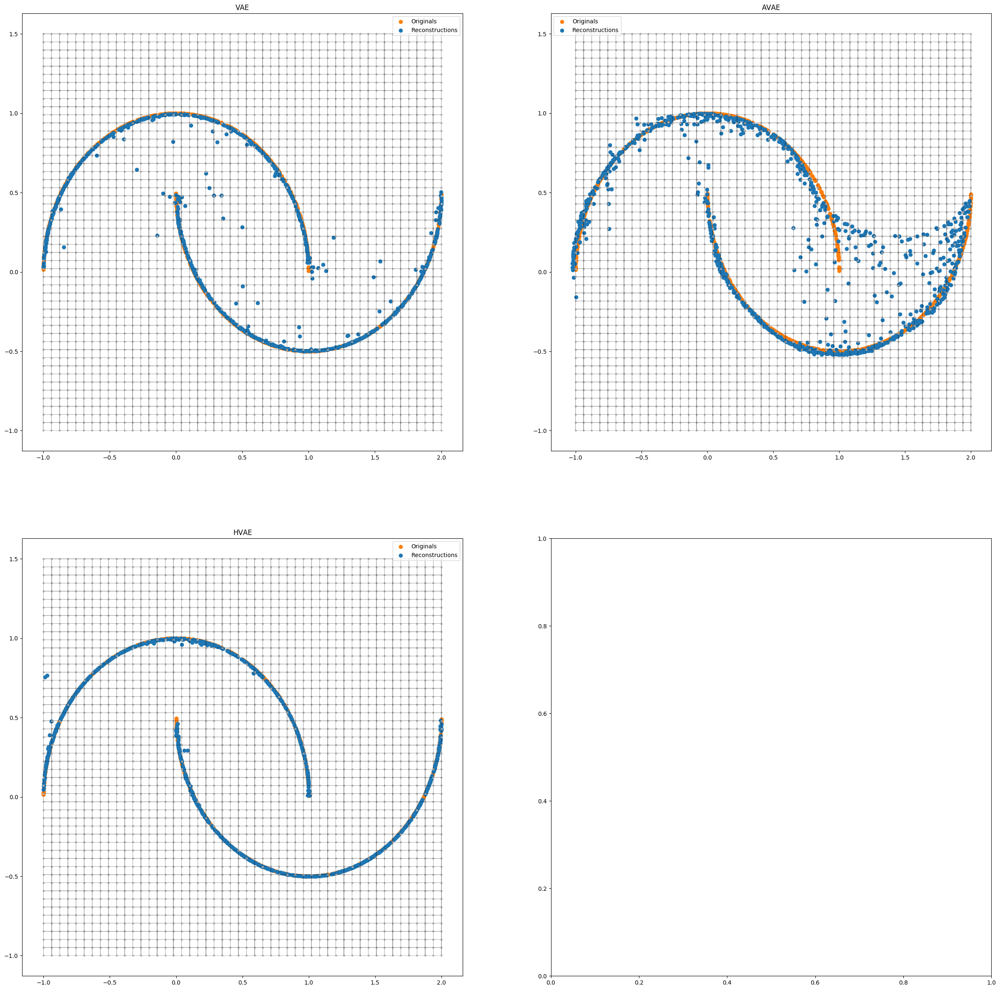

In [31]:
fig, axes = plt.subplots(2, 2, figsize=(30, 30))
ax1, ax2, ax3, ax4 = [ax for ax_row in axes for ax in ax_row ]
plot_vectors_and_mesh(x_originals, x_train_meshgrid, alpha=1, color='C1', label='Originals', ax=ax1)
plot_vectors_and_mesh(vae_p_x_mu, x_train_meshgrid, alpha=1, label='Reconstructions', ax=ax1)
plot_vectors_and_mesh(x_originals, x_train_meshgrid, alpha=1, color='C1', label='Originals', ax=ax2)
plot_vectors_and_mesh(avae_p_x_mu, x_train_meshgrid, alpha=1, label='Reconstructions', ax=ax2)
plot_vectors_and_mesh(x_originals, x_train_meshgrid, alpha=1, color='C1', label='Originals', ax=ax3)
plot_vectors_and_mesh(hvae_p_x_mu, x_train_meshgrid, alpha=1, label='Reconstructions', ax=ax3)
ax1.set_title('VAE')
ax2.set_title('AVAE')
ax3.set_title('HVAE')
plt.show()

## Visualize sampling

In [32]:
n_samples = 10000
p_z_samples = torch.randn((n_samples, 2))

In [34]:
with torch.no_grad():
    vae_p_x_samples, (vae_p_x_mu, vae_p_x_log_var) = vae.sample(p_z_samples)
    avae_p_x_samples, (avae_p_x_mu, avae_p_x_log_var) = avae.sample(p_z_samples)
    hvae_p_x_samples, (hvae_p_x_mu, hvae_p_x_log_var) = hvae.sample(p_z_samples)

NameError: name 'q_z' is not defined

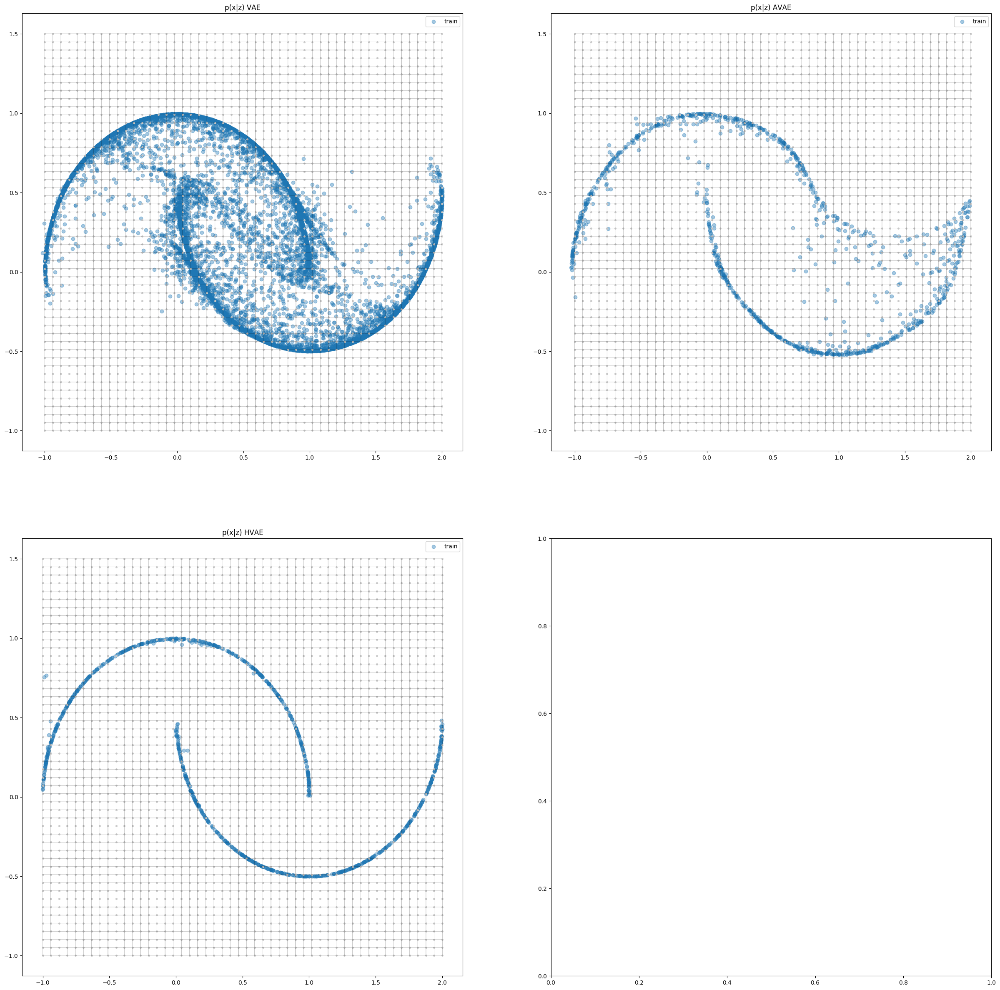

In [35]:
fig, axes = plt.subplots(2, 2, figsize=(30, 30))
ax1, ax2, ax3, ax4 = [ax for ax_row in axes for ax in ax_row ]
plot_vectors_and_mesh(vae_p_x_mu, x_train_meshgrid, ax=ax1)
plot_vectors_and_mesh(avae_p_x_mu, x_train_meshgrid, ax=ax2)
plot_vectors_and_mesh(hvae_p_x_mu, x_train_meshgrid, ax=ax3)
ax1.set_title('p(x|z) VAE')
ax2.set_title('p(x|z) AVAE')
ax3.set_title('p(x|z) HVAE')
plt.show()

## OOD detection based on ELBO

In [136]:
def compute_elbo_no_iw(model, x):
    with torch.no_grad():
        x = torch.FloatTensor(x)

        px, px_args = model.forward(x)

        kl_divergence = vae.kl_divergence
        likelihood = model.log_likelihood(x, *px_args)
        elbo = likelihood - kl_divergence

        return elbo, kl_divergence, likelihood

def compute_elbo_iw(model, x, importance_samples=1):
    with torch.no_grad():
        x = torch.FloatTensor(x)
        x = x.repeat(1, importance_samples).view(-1, x.shape[1])

        px, px_args = model.forward(x)

        kl_divergence = model.kl_divergence
        likelihood = model.log_likelihood(x, *px_args)
        elbo = likelihood - kl_divergence

        elbo_mean = vari.utilities.log_sum_exp(elbo.view(-1, importance_samples, 1), axis=1, sum_op=torch.mean).view(-1)  # (B, 1, 1)
        lielihood_mean = vari.utilities.log_sum_exp(likelihood.view(-1, importance_samples, 1), axis=1, sum_op=torch.mean).view(-1)  # (B, 1, 1)
        kl_divergence_mean = vari.utilities.log_sum_exp(kl_divergence.view(-1, importance_samples, 1), axis=1, sum_op=torch.mean).view(-1)  # (B, 1, 1)

        return elbo_mean, kl_divergence_mean, lielihood_mean

def compute_elbo(model, x, importance_samples=0):
    if importance_samples == 0:
        return compute_elbo_no_iw(model, x)
    return compute_elbo_iw(model, x, importance_samples)

In [137]:
vae_elbo_train, vae_kl_train, vae_likelihood_train = compute_elbo(vae, x_train, importance_samples=10)
vae_elbo_test1, vae_kl_test1, vae_likelihood_test1 = compute_elbo(vae, x_test1, importance_samples=10)
vae_elbo_test2, vae_kl_test2, vae_likelihood_test2 = compute_elbo(vae, x_test2, importance_samples=10)

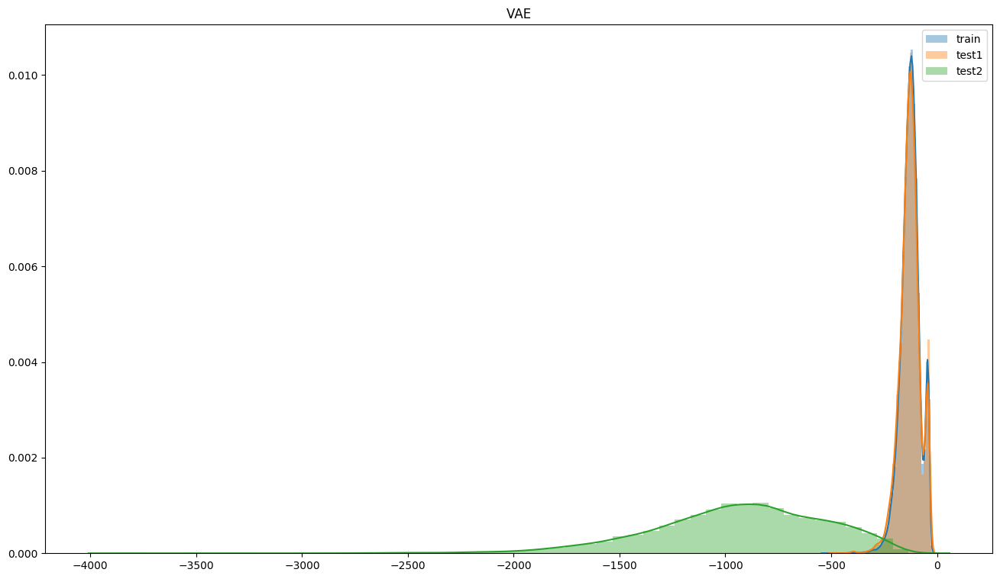

In [138]:
fig, ax1 = plt.subplots(1, 1, figsize=(16, 9))
seaborn.distplot(vae_elbo_train, ax=ax1, label='train')
seaborn.distplot(vae_elbo_test1, ax=ax1, label='test1')
seaborn.distplot(vae_elbo_test2, ax=ax1, label='test2')
ax1.set_title('VAE')
ax1.legend()

In [ ]:
avae_elbo_train, avae_kl_train, avae_likelihood_train = compute_elbo(avae, x_train, importance_samples=10)
avae_elbo_test1, avae_kl_test1, avae_likelihood_test1 = compute_elbo(avae, x_test1, importance_samples=10)
avae_elbo_test2, avae_kl_test2, avae_likelihood_test2 = compute_elbo(avae, x_test2, importance_samples=10)

In [ ]:
fig, ax1 = plt.subplots(1, 1, figsize=(16, 9))
seaborn.distplot(avae_elbo_train, ax=ax1, label='train')
seaborn.distplot(avae_elbo_test1, ax=ax1, label='test1')
seaborn.distplot(avae_elbo_test2, ax=ax1, label='test2')
ax1.set_title('AVAE')
ax1.legend()

In [139]:
hvae_elbo_train, hvae_kl_train, hvae_likelihood_train = compute_elbo(hvae, x_train, importance_samples=10)
hvae_elbo_test1, hvae_kl_test1, hvae_likelihood_test1 = compute_elbo(hvae, x_test1, importance_samples=10)
hvae_elbo_test2, hvae_kl_test2, hvae_likelihood_test2 = compute_elbo(hvae, x_test2, importance_samples=10)

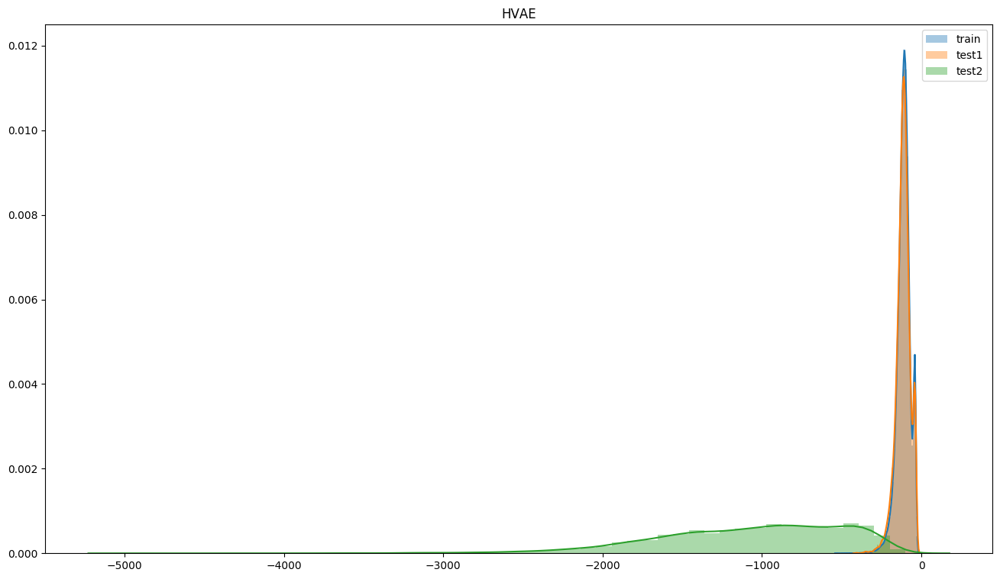

In [140]:
fig, ax1 = plt.subplots(1, 1, figsize=(16, 9))
seaborn.distplot(hvae_elbo_train, ax=ax1, label='train')
seaborn.distplot(hvae_elbo_test1, ax=ax1, label='test1')
seaborn.distplot(hvae_elbo_test2, ax=ax1, label='test2')
ax1.set_title('HVAE')
ax1.legend()